In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sweetviz as sv
import warnings


In [2]:
warnings.filterwarnings('ignore')

In [3]:
twitch_df_X = pd.read_pickle('twitch_df_wrng.pkl')

In [4]:
twitch_df_X.head()

,Game,Month,Year,Hours_watched,Hours_streamed,Peak_viewers,Peak_channels,Streamers,Avg_viewers,Avg_channels,Avg_channel_ratio,Date,one_month_future,three_month_future,six_month_future,Hours_watched_1mth,Hours_watched_3mth,Hours_watched_6mth
0,7 Days to Die,1,2016,269681,12131,4405,44,1240,362.0,16.0,0.04,2016-01-01,2016-02-01,2016-04-01,2016-07-01,139365,212199,2063116
1,Agar.io,1,2016,255617,20705,4183,74,4472,344.0,28.0,0.08,2016-01-01,2016-02-01,2016-04-01,2016-07-01,254146,198757,0
2,Age of Empires,1,2016,248884,232,107455,18,40,335.0,0.0,0.00,2016-01-01,2016-02-01,2016-04-01,2016-07-01,0,0,0
3,Alien: Isolation,1,2016,264294,11799,9590,42,3968,355.0,16.0,0.05,2016-01-01,2016-02-01,2016-04-01,2016-07-01,109754,122248,0
4,American Truck Simulator,1,2016,314055,724,43089,48,186,422.0,1.0,0.00,2016-01-01,2016-02-01,2016-04-01,2016-07-01,2134600,141057,0


In [5]:
twitch_df = pd.read_pickle('twitch_df_og.pkl')

In [6]:
twitch_df.head()

,Game,Month,Year,Hours_watched,Hours_streamed,Peak_viewers,Peak_channels,Streamers,Avg_viewers,Avg_channels,Avg_channel_ratio,Date
12,7 Days to Die,1,2016,269681,12131,4405,44,1240,362.0,16.0,0.04,2016-01-01
258,Agar.io,1,2016,255617,20705,4183,74,4472,344.0,28.0,0.08,2016-01-01
264,Age of Empires,1,2016,248884,232,107455,18,40,335.0,0.0,0.00,2016-01-01
422,Alien: Isolation,1,2016,264294,11799,9590,42,3968,355.0,16.0,0.05,2016-01-01
477,American Truck Simulator,1,2016,314055,724,43089,48,186,422.0,1.0,0.00,2016-01-01


In [7]:
twitch_df_X[(twitch_df_X['Hours_watched_1mth'] == 0) & (twitch_df_X['Hours_watched_6mth'] != 0)]

,Game,Month,Year,Hours_watched,Hours_streamed,Peak_viewers,Peak_channels,Streamers,Avg_viewers,Avg_channels,Avg_channel_ratio,Date,one_month_future,three_month_future,six_month_future,Hours_watched_1mth,Hours_watched_3mth,Hours_watched_6mth
94,Metroid Prime,1,2016,248704,1136,150677,25,146,334.0,2.0,0.01,2016-01-01,2016-02-01,2016-04-01,2016-07-01,0,0,230478
151,Super Mario Bros. 3,1,2016,426084,1161,206252,17,308,573.0,2.0,0.00,2016-01-01,2016-02-01,2016-04-01,2016-07-01,0,0,340008
155,Super Mario World,1,2016,270879,2888,150670,21,753,364.0,4.0,0.01,2016-01-01,2016-02-01,2016-04-01,2016-07-01,0,130289,309409
156,Super Metroid,1,2016,576156,3905,191257,35,510,774.0,5.0,0.01,2016-01-01,2016-02-01,2016-04-01,2016-07-01,0,117957,278469
166,The Elder Scrolls IV: Oblivion,1,2016,195502,1723,9447,11,294,263.0,2.0,0.01,2016-01-01,2016-02-01,2016-04-01,2016-07-01,0,0,180065
203,ArcheAge,1,2017,246054,14811,3868,43,1457,331.0,20.0,0.06,2017-01-01,2017-02-01,2017-04-01,2017-07-01,0,0,479510
217,DOOM,1,2017,237091,21973,16019,73,6685,319.0,30.0,0.09,2017-01-01,2017-02-01,2017-04-01,2017-07-01,0,133637,529709
225,Escape From Tarkov,1,2017,358976,1118,36235,7,169,482.0,2.0,0.00,2017-01-01,2017-02-01,2017-04-01,2017-07-01,0,367952,392259
316,Cuphead,1,2018,286296,26583,8138,87,8844,385.0,36.0,0.09,2018-01-01,2018-02-01,2018-04-01,2018-07-01,0,0,281690
318,Dead Cells,1,2018,240821,10988,5699,37,2842,324.0,15.0,0.05,2018-01-01,2018-02-01,2018-04-01,2018-07-01,0,231661,258311


In [8]:
twitch_df_X[(twitch_df_X['Hours_watched_1mth'] == 0) & (twitch_df_X['Hours_watched_3mth'] != 0)].describe()

,Month,Year,Hours_watched,Hours_streamed,Peak_viewers,Peak_channels,Streamers,Avg_viewers,Avg_channels,Avg_channel_ratio,Hours_watched_1mth,Hours_watched_3mth,Hours_watched_6mth
count,35.000000,35.000000,3.500000e+01,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.0,3.500000e+01,3.500000e+01
mean,2.171429,2018.114286,4.944313e+05,13915.885714,55058.314286,107.285714,2890.742857,675.142857,19.057143,0.038286,0.0,1.227838e+06,1.872015e+05
std,1.962677,1.966954,4.452449e+05,14098.685022,61231.169945,157.518920,3355.366880,608.396743,19.083320,0.042252,0.0,2.408022e+06,2.788242e+05
min,1.000000,2016.000000,1.041330e+05,846.000000,2614.000000,7.000000,127.000000,155.000000,1.000000,0.000000,0.0,1.024470e+05,0.000000e+00
25%,1.000000,2017.000000,2.190645e+05,3521.000000,7725.500000,24.500000,507.000000,304.000000,5.000000,0.010000,0.0,1.572320e+05,0.000000e+00
50%,1.000000,2017.000000,3.448180e+05,9461.000000,27536.000000,57.000000,1428.000000,463.000000,14.000000,0.020000,0.0,3.391970e+05,0.000000e+00
75%,2.000000,2019.500000,5.212395e+05,18359.500000,74112.500000,87.500000,4058.000000,700.500000,25.500000,0.045000,0.0,8.018675e+05,2.757860e+05
max,8.000000,2022.000000,2.224158e+06,58877.000000,191257.000000,691.000000,12628.000000,2989.000000,79.000000,0.190000,0.0,1.107092e+07,1.015656e+06


                                             |          | [  0%]   00:00 -> (? left)


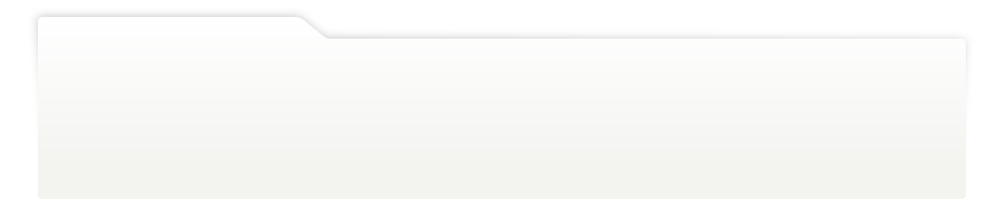
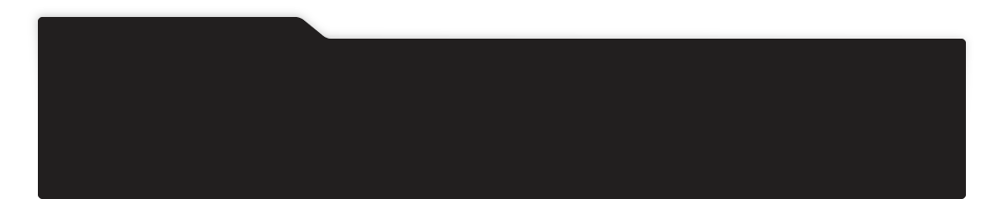
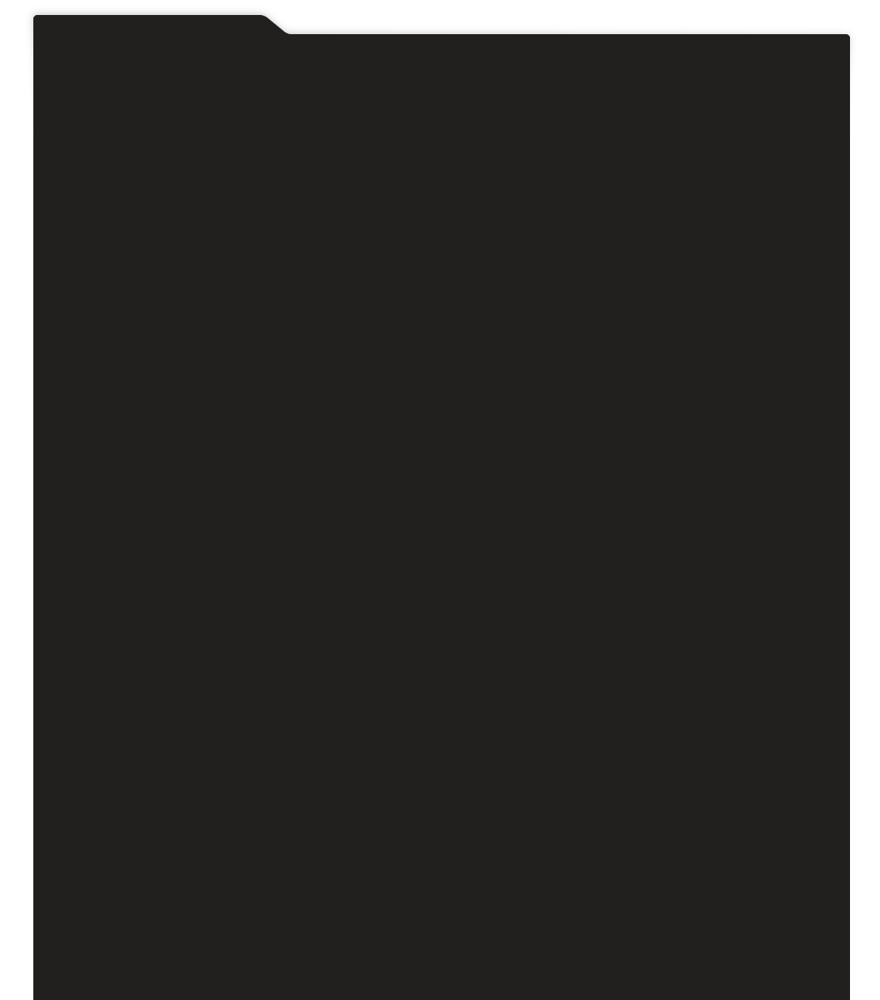
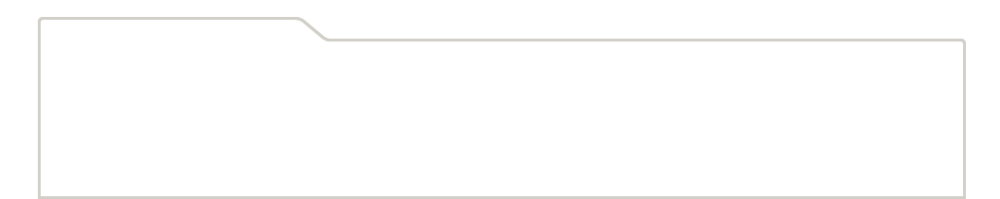
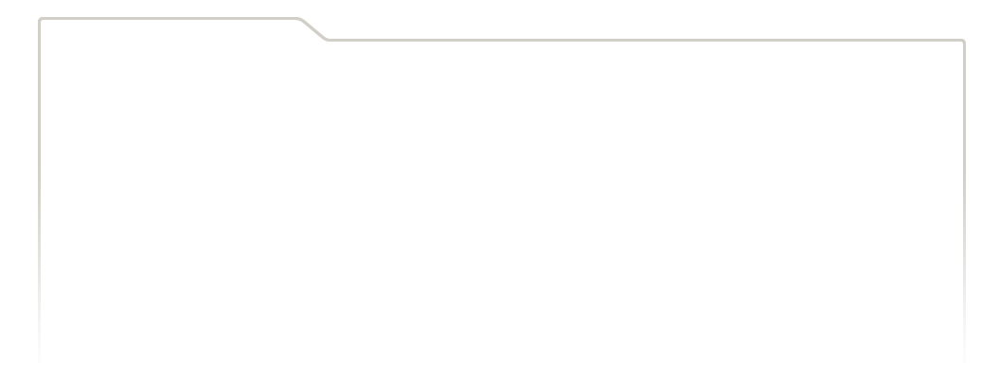
...
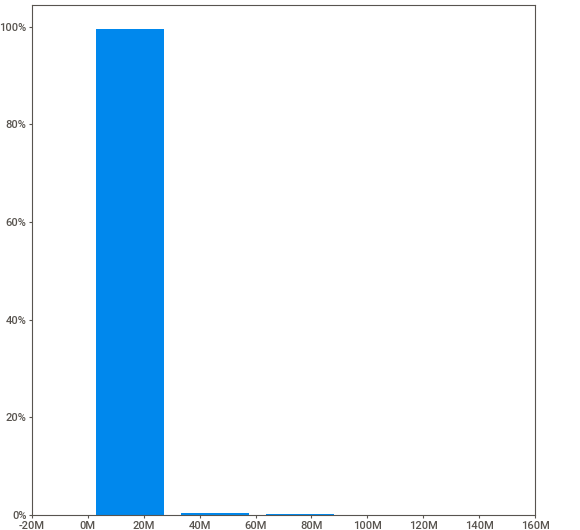
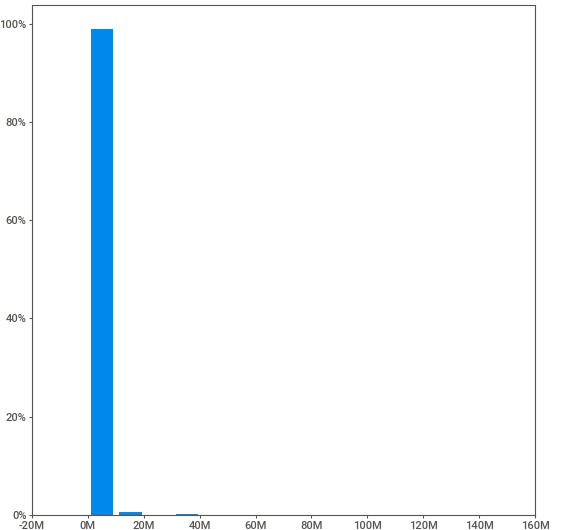
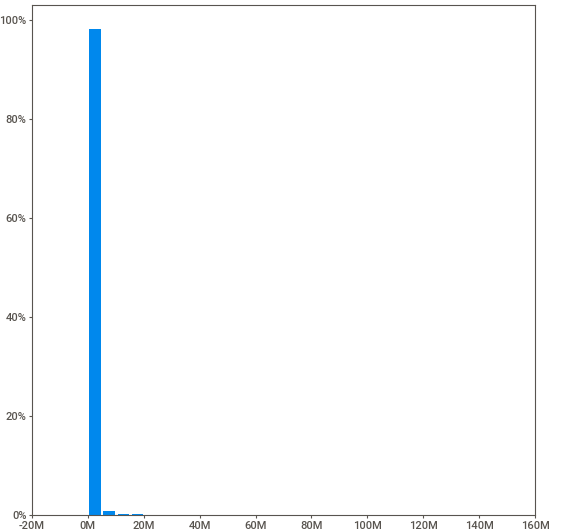
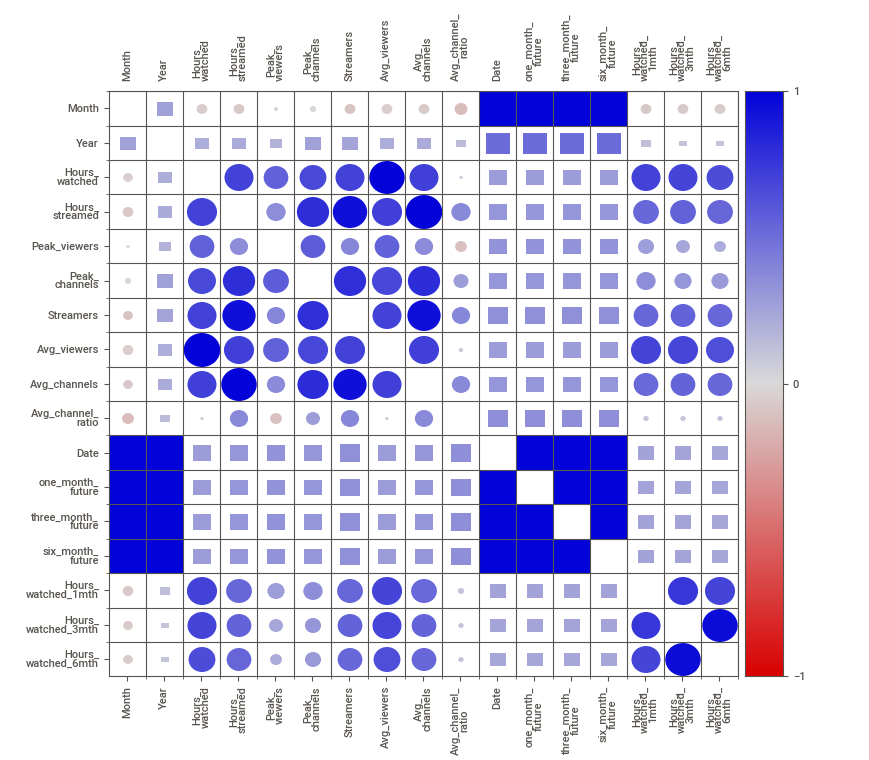
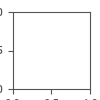

In [9]:
report = sv.analyze(twitch_df_X)
report.show_notebook(  w=None, 
                h=None, 
                scale=None,
                layout='widescreen',
                filepath=None)

                                             |          | [  0%]   00:00 -> (? left)


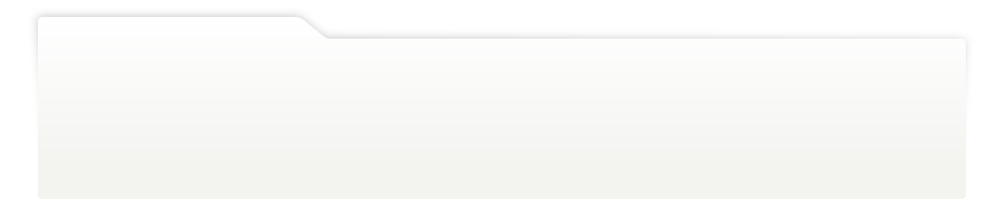
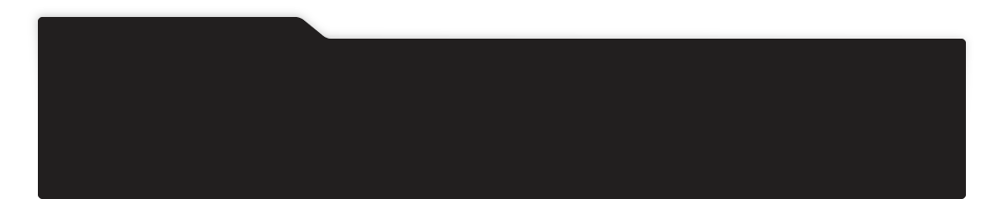
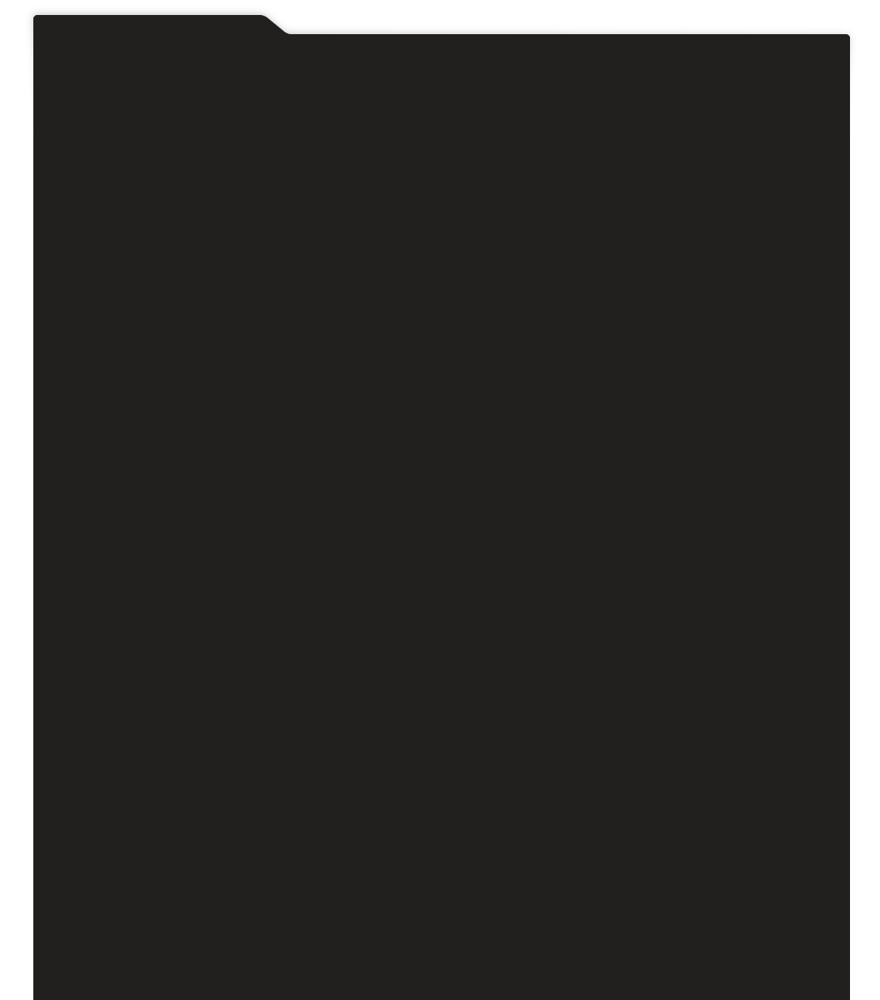
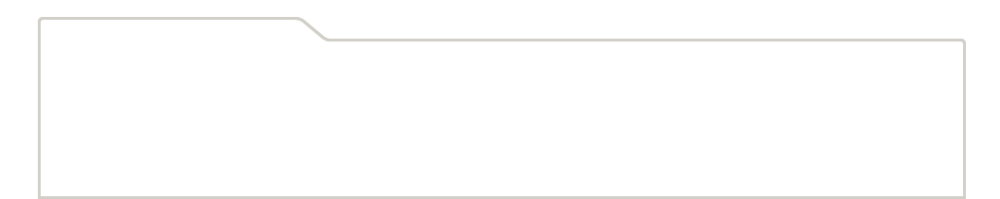
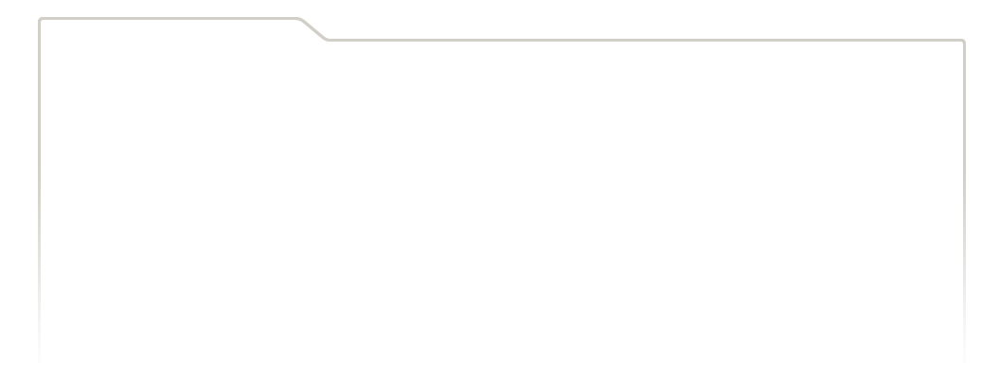
...
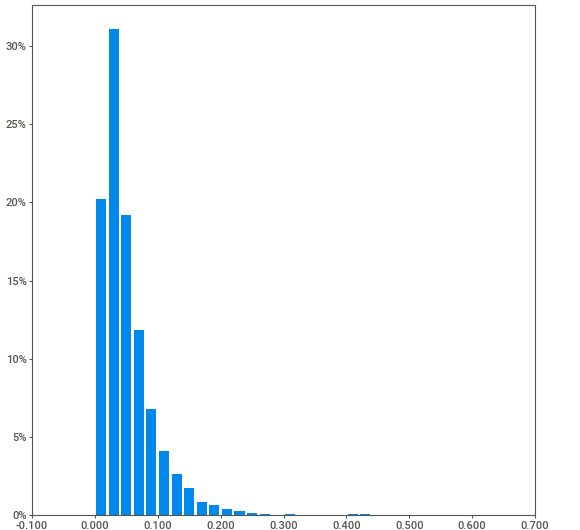
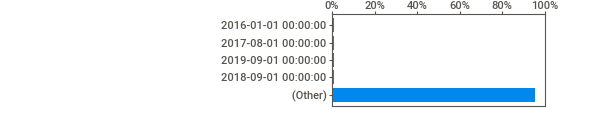
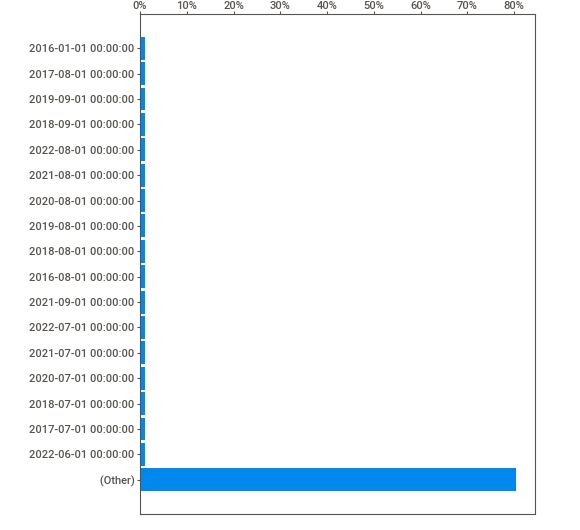
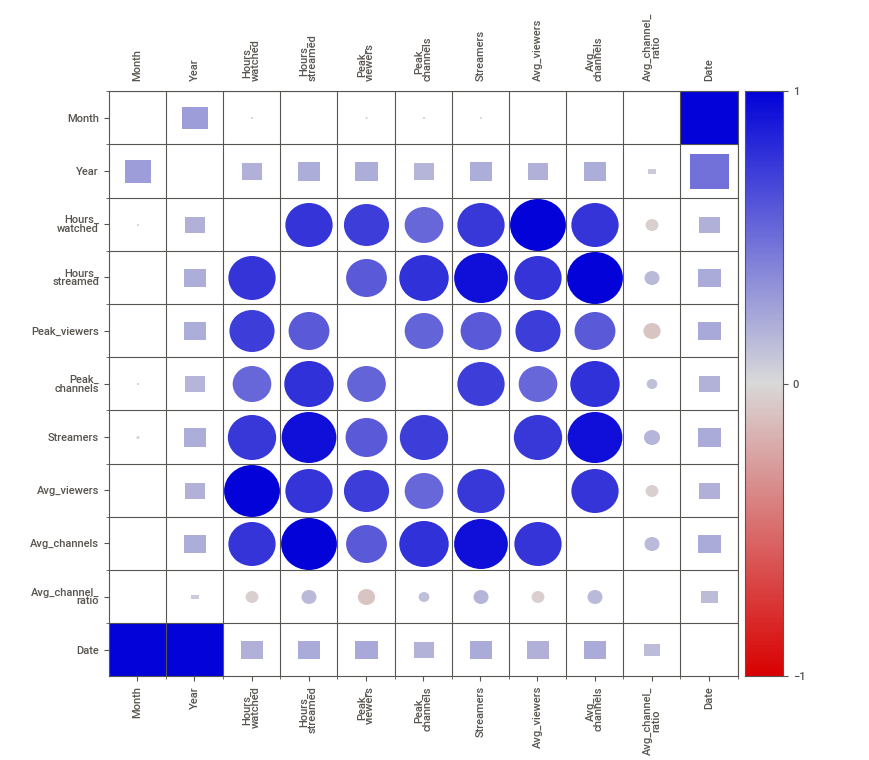
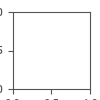

In [10]:
report = sv.analyze(twitch_df)
report.show_notebook(  w=None, 
                h=None, 
                scale=None,
                layout='widescreen',
                filepath=None)

In [11]:
'''This library is actually kind of amazing. I found this when I was struggling to get ydata_profiling to work properly. 
A big thing is that the first time a game breaks into the top 200 is typically January. The most common date was 
01-01-2016, no surprise there as that is when the dataset starts by definition that has the max value of 200. 
However, second was 01-01-2017, third was 01-01-2018 etc.... Almost half of the games break into the top 200 in January 
and 01-01-2016 only accounts for 10%. Do these games remain popular in past January or are these more likely to be fads?'''

'This library is actually kind of amazing. I found this when I was struggling to get ydata_profiling to work properly. \nA big thing is that the first time a game breaks into the top 200 is typically January. The most common date was \n01-01-2016, no surprise there as that is when the dataset starts by definition that has the max value of 200. \nHowever, second was 01-01-2017, third was 01-01-2018 etc.... Almost half of the games break into the top 200 in January \nand 01-01-2016 only accounts for 10%. Do these games remain popular in past January or are these more likely to be fads?'

In [12]:
jan_df= twitch_df_X[twitch_df_X['Month'] == 1]
jan_df.head(10)

,Game,Month,Year,Hours_watched,Hours_streamed,Peak_viewers,Peak_channels,Streamers,Avg_viewers,Avg_channels,Avg_channel_ratio,Date,one_month_future,three_month_future,six_month_future,Hours_watched_1mth,Hours_watched_3mth,Hours_watched_6mth
0,7 Days to Die,1,2016,269681,12131,4405,44,1240,362.0,16.0,0.04,2016-01-01,2016-02-01,2016-04-01,2016-07-01,139365,212199,2063116
1,Agar.io,1,2016,255617,20705,4183,74,4472,344.0,28.0,0.08,2016-01-01,2016-02-01,2016-04-01,2016-07-01,254146,198757,0
2,Age of Empires,1,2016,248884,232,107455,18,40,335.0,0.0,0.00,2016-01-01,2016-02-01,2016-04-01,2016-07-01,0,0,0
3,Alien: Isolation,1,2016,264294,11799,9590,42,3968,355.0,16.0,0.05,2016-01-01,2016-02-01,2016-04-01,2016-07-01,109754,122248,0
4,American Truck Simulator,1,2016,314055,724,43089,48,186,422.0,1.0,0.00,2016-01-01,2016-02-01,2016-04-01,2016-07-01,2134600,141057,0
5,Ark: Survival Evolved,1,2016,1951875,93060,19486,241,9575,2623.0,125.0,0.05,2016-01-01,2016-02-01,2016-04-01,2016-07-01,0,0,0
6,Arma 3,1,2016,2542838,86219,32132,275,8771,3418.0,116.0,0.03,2016-01-01,2016-02-01,2016-04-01,2016-07-01,2912034,3130387,4422829
7,Azure Striker GUNVOLT,1,2016,197178,217,135933,14,71,265.0,0.0,0.00,2016-01-01,2016-02-01,2016-04-01,2016-07-01,0,0,0
8,Banjo-Kazooie,1,2016,241250,2234,108131,28,547,324.0,3.0,0.01,2016-01-01,2016-02-01,2016-04-01,2016-07-01,0,0,0
9,BattleBlock Theater,1,2016,332256,2041,152739,19,1097,447.0,3.0,0.01,2016-01-01,2016-02-01,2016-04-01,2016-07-01,0,0,0


                                             |          | [  0%]   00:00 -> (? left)


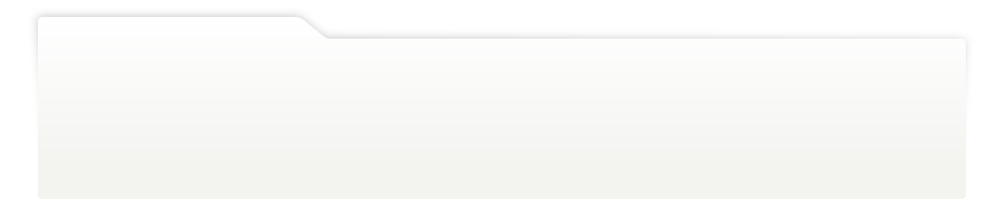
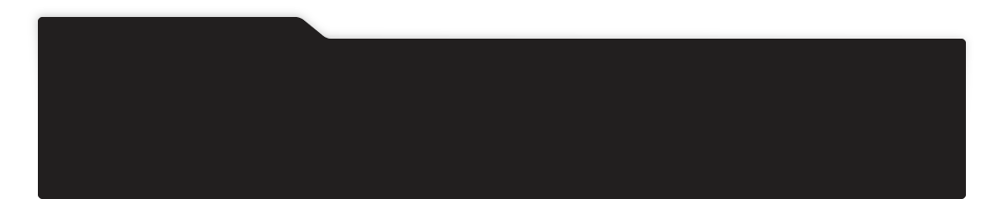
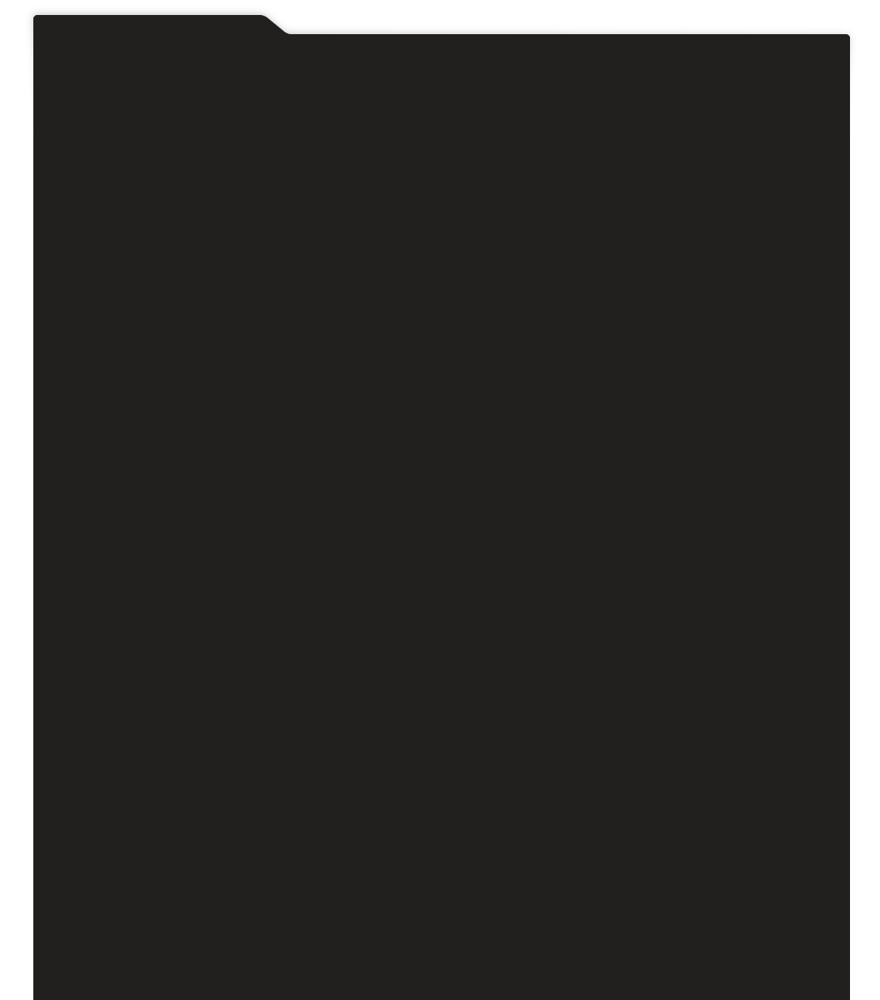
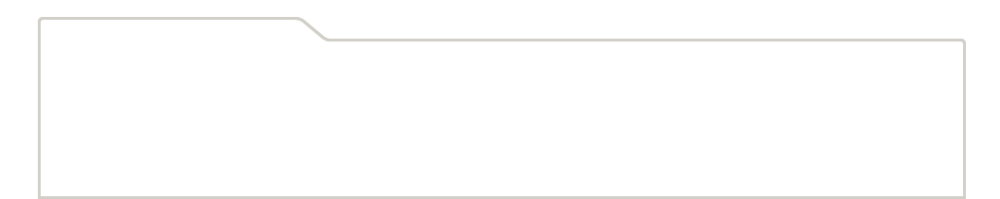
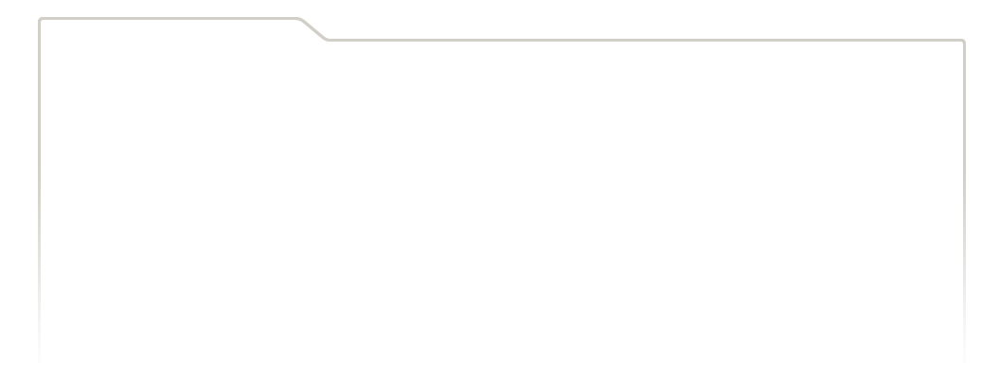
...
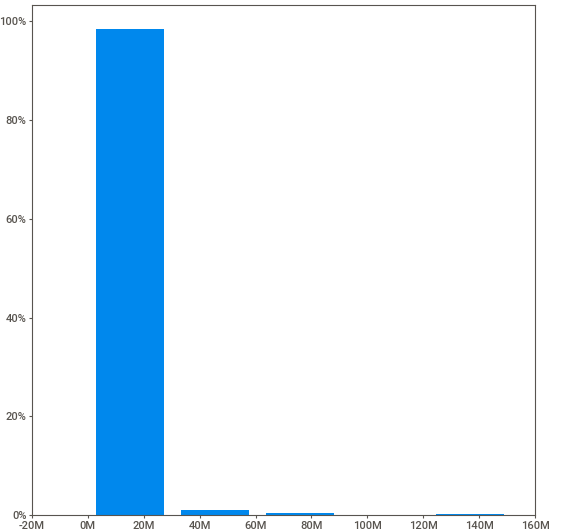
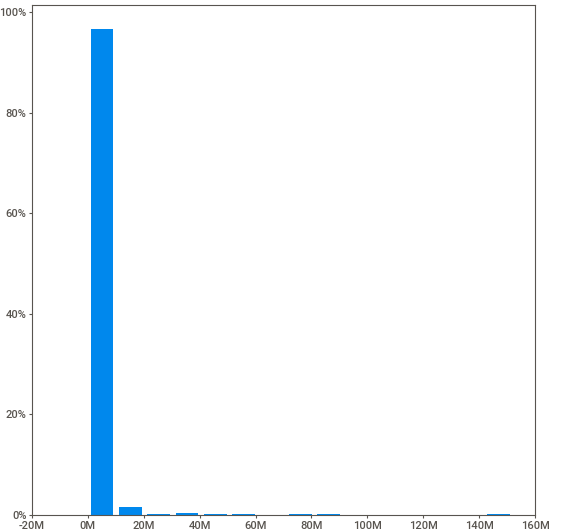
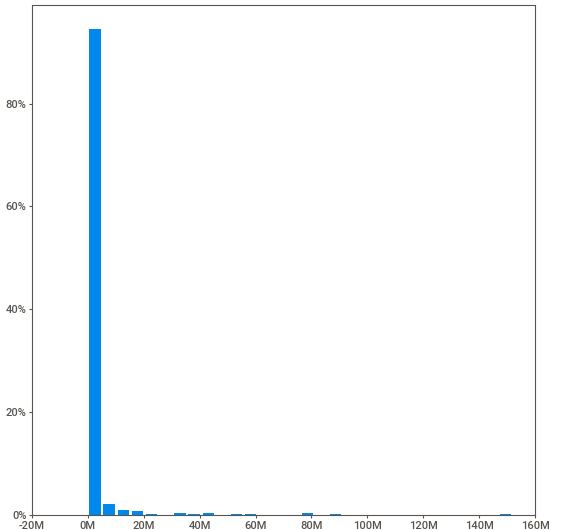
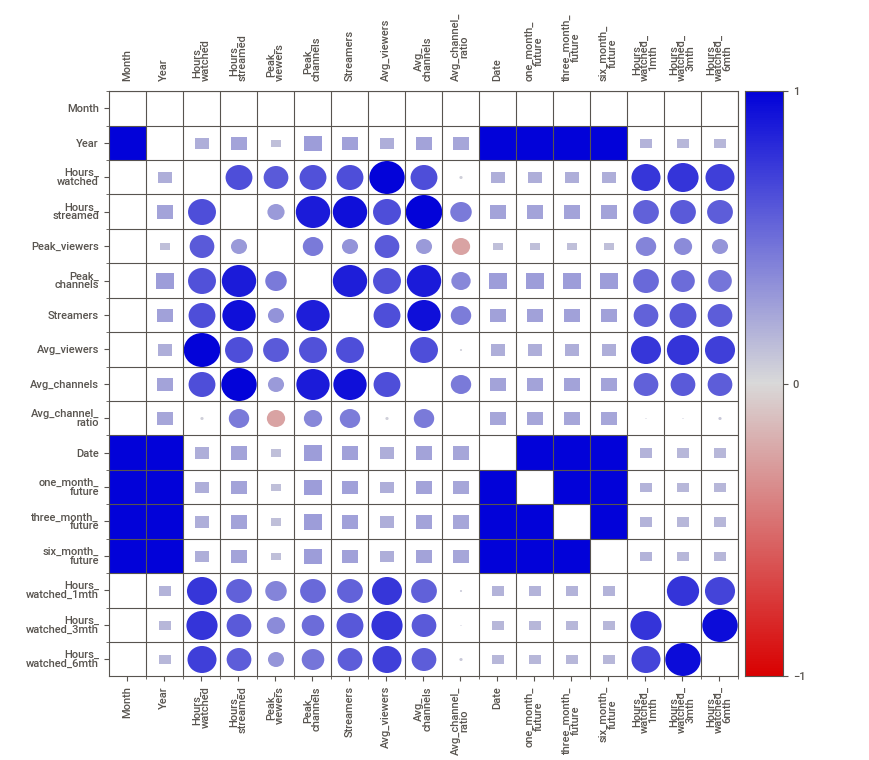
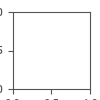

In [13]:
report = sv.analyze(jan_df)
report.show_notebook(  w=None, 
                h=None, 
                scale=None,
                layout='widescreen',
                filepath=None)

In [14]:
x = len(twitch_df_X)
jan_list = []
for i in range(x):
    if twitch_df_X['Month'][i] == 1:
        jan_list.append(1)
    else:
        jan_list.append(0)
    

In [15]:
twitch_df_X['Jan_Debut_Month'] = jan_list

In [16]:
twitch_df_X.head()

,Game,Month,Year,Hours_watched,Hours_streamed,Peak_viewers,Peak_channels,Streamers,Avg_viewers,Avg_channels,Avg_channel_ratio,Date,one_month_future,three_month_future,six_month_future,Hours_watched_1mth,Hours_watched_3mth,Hours_watched_6mth,Jan_Debut_Month
0,7 Days to Die,1,2016,269681,12131,4405,44,1240,362.0,16.0,0.04,2016-01-01,2016-02-01,2016-04-01,2016-07-01,139365,212199,2063116,1
1,Agar.io,1,2016,255617,20705,4183,74,4472,344.0,28.0,0.08,2016-01-01,2016-02-01,2016-04-01,2016-07-01,254146,198757,0,1
2,Age of Empires,1,2016,248884,232,107455,18,40,335.0,0.0,0.00,2016-01-01,2016-02-01,2016-04-01,2016-07-01,0,0,0,1
3,Alien: Isolation,1,2016,264294,11799,9590,42,3968,355.0,16.0,0.05,2016-01-01,2016-02-01,2016-04-01,2016-07-01,109754,122248,0,1
4,American Truck Simulator,1,2016,314055,724,43089,48,186,422.0,1.0,0.00,2016-01-01,2016-02-01,2016-04-01,2016-07-01,2134600,141057,0,1


                                             |          | [  0%]   00:00 -> (? left)


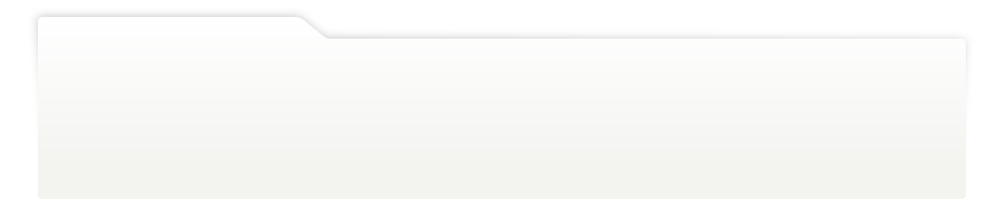
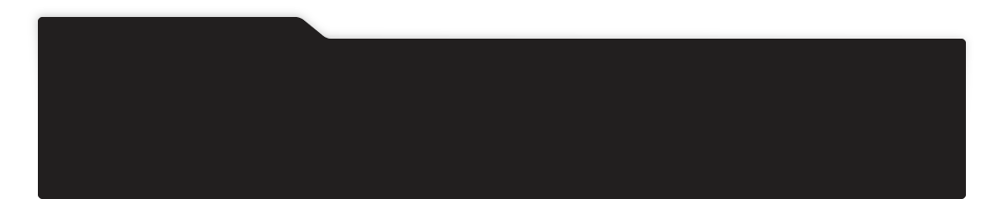
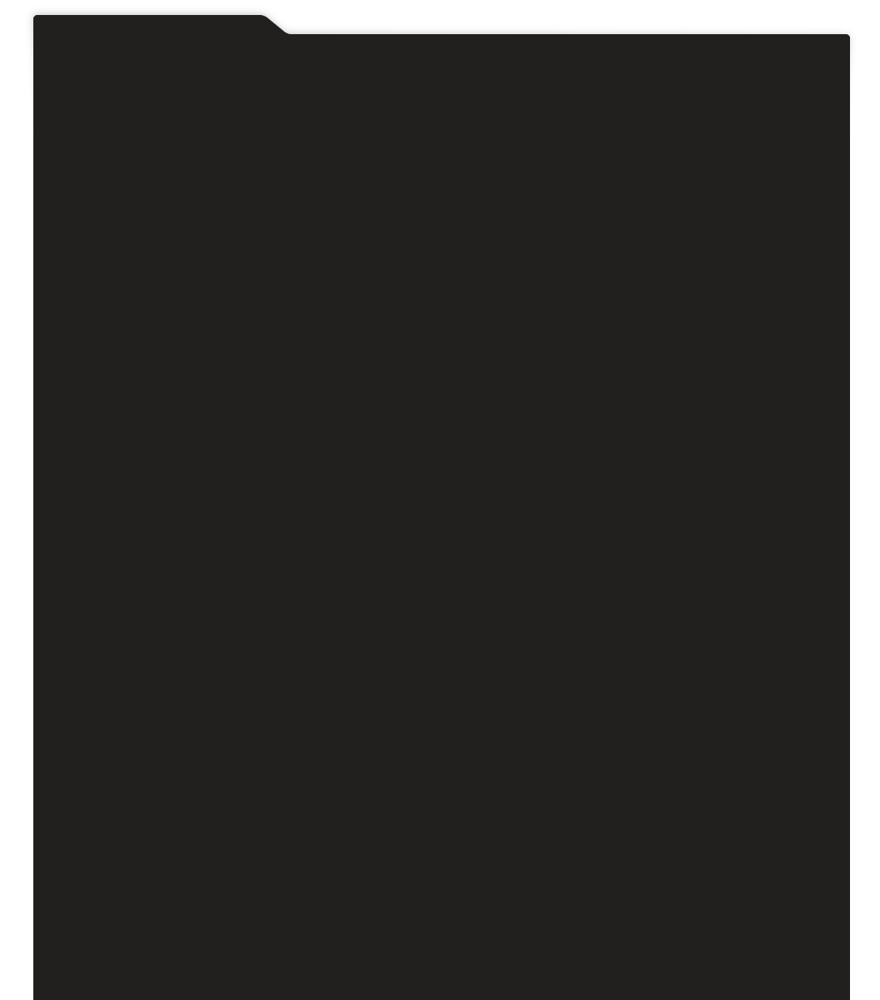
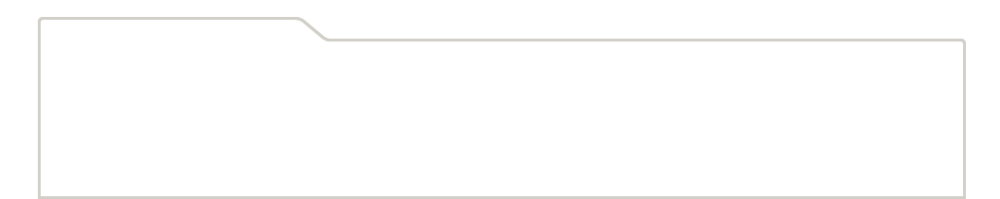
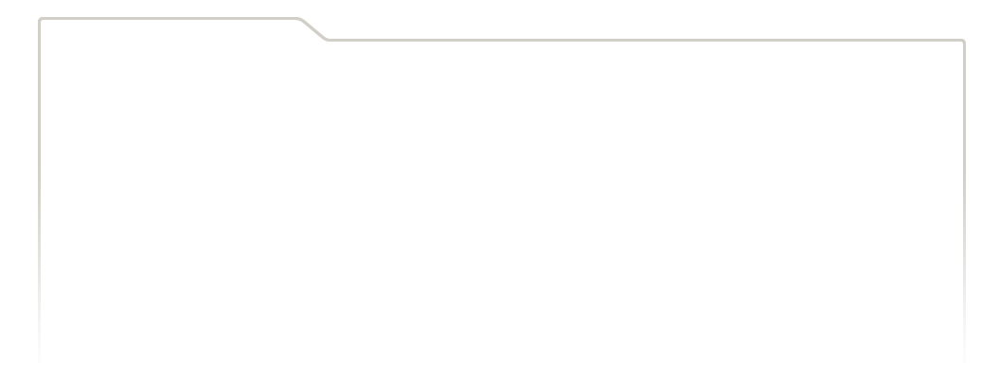
...
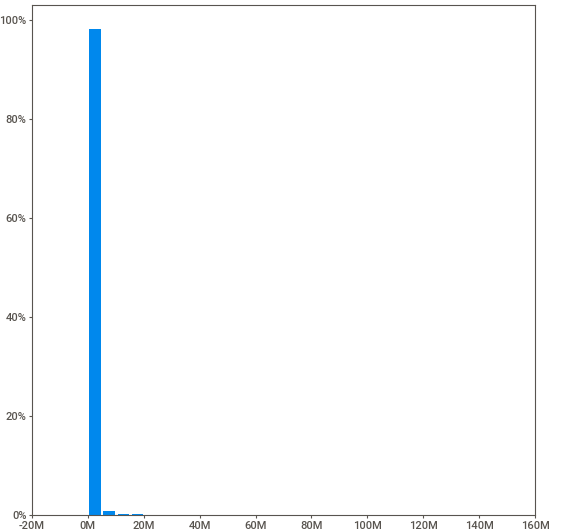
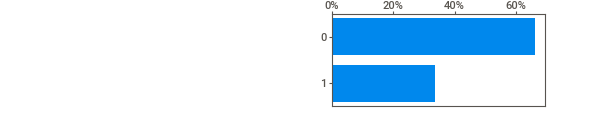
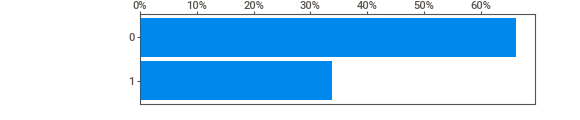
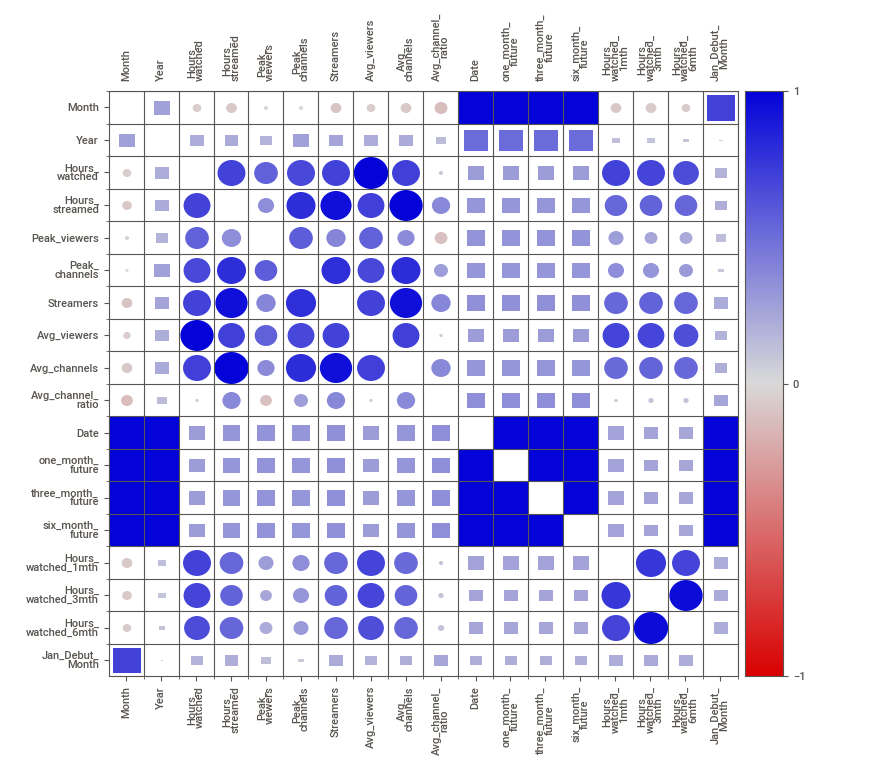
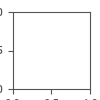

In [17]:
report = sv.analyze(twitch_df_X)
report.show_notebook(  w=None, 
                h=None, 
                scale=None,
                layout='widescreen',
                filepath=None)

In [18]:
'''Based on the EDA in this dataset it seems that if a game debuted in January it will be popular one month later. 
Let me remove 2016 and see if the correlation still holds
Also of note there is a .95 correlation bewteen if a game is popular in the first 3 months (hours watched) and 6 months,
thus a prediction on hours watched 6 months from debut is not required'''

'Based on the EDA in this dataset it seems that if a game debuted in January it will be popular one month later. \nLet me remove 2016 and see if the correlation still holds\nAlso of note there is a .95 correlation bewteen if a game is popular in the first 3 months (hours watched) and 6 months,\nthus a prediction on hours watched 6 months from debut is not required'

In [19]:
no_2016_df = twitch_df_X[twitch_df_X['Year']!= 2016]
no_2016_df.head()

,Game,Month,Year,Hours_watched,Hours_streamed,Peak_viewers,Peak_channels,Streamers,Avg_viewers,Avg_channels,Avg_channel_ratio,Date,one_month_future,three_month_future,six_month_future,Hours_watched_1mth,Hours_watched_3mth,Hours_watched_6mth,Jan_Debut_Month
200,ARK: Survival Evolved,1,2017,2167646,192501,18756,483,24488,2914.0,259.0,0.09,2017-01-01,2017-02-01,2017-04-01,2017-07-01,1830475,1070666,1259946,1
201,ASTRONEER,1,2017,761112,21225,29721,72,4782,1023.0,29.0,0.03,2017-01-01,2017-02-01,2017-04-01,2017-07-01,0,0,0,1
202,Age of Empires II,1,2017,310965,5299,4129,16,344,418.0,7.0,0.02,2017-01-01,2017-02-01,2017-04-01,2017-07-01,287503,258412,321483,1
203,ArcheAge,1,2017,246054,14811,3868,43,1457,331.0,20.0,0.06,2017-01-01,2017-02-01,2017-04-01,2017-07-01,0,0,479510,1
204,Assassin's Creed II,1,2017,341584,3049,33045,22,613,459.0,4.0,0.01,2017-01-01,2017-02-01,2017-04-01,2017-07-01,0,0,0,1


                                             |          | [  0%]   00:00 -> (? left)


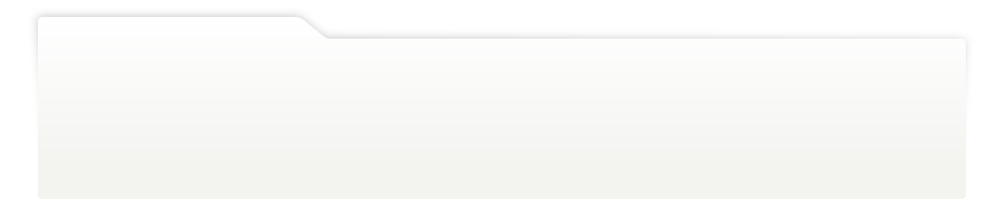
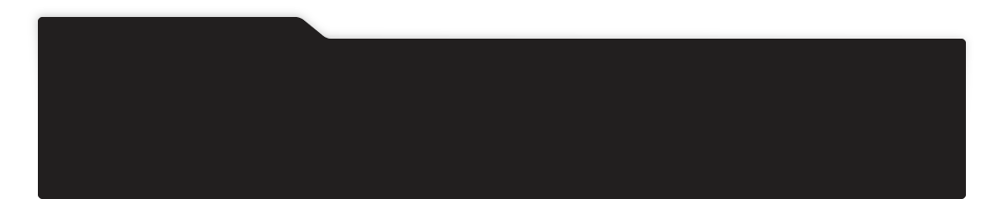
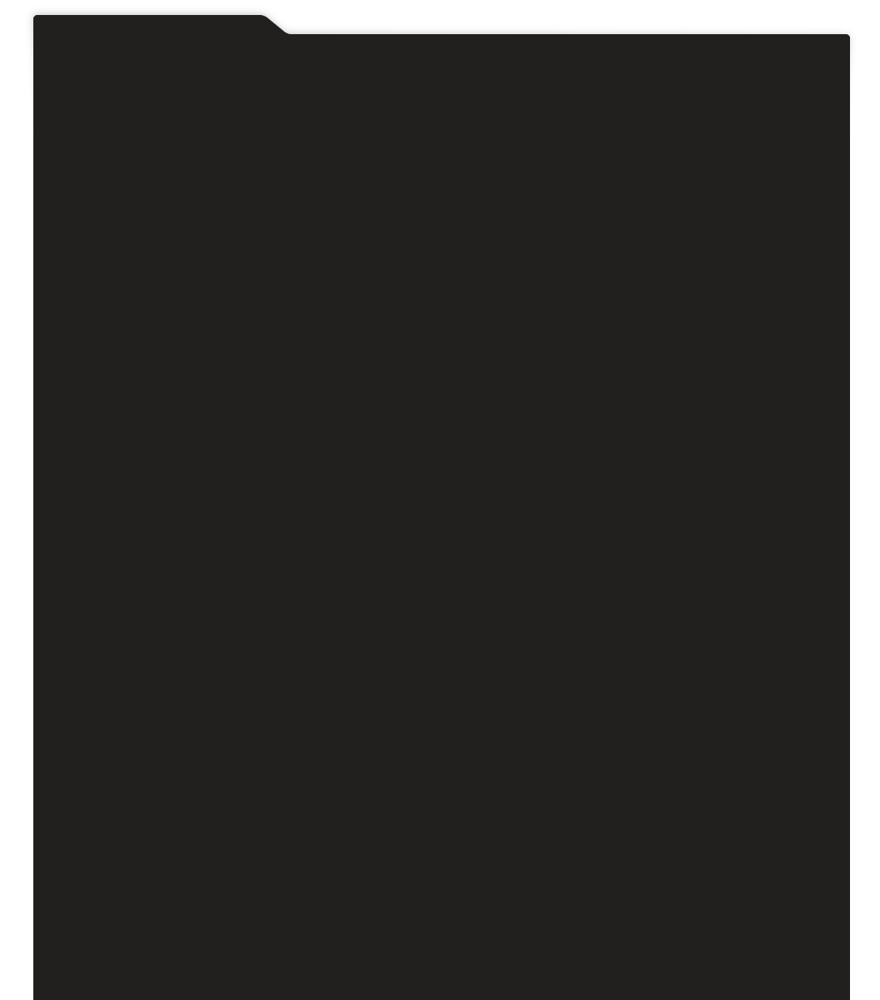
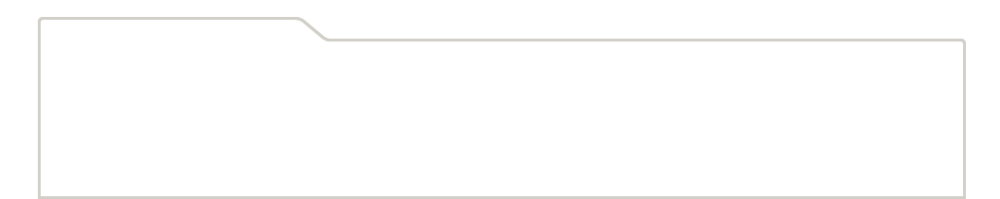
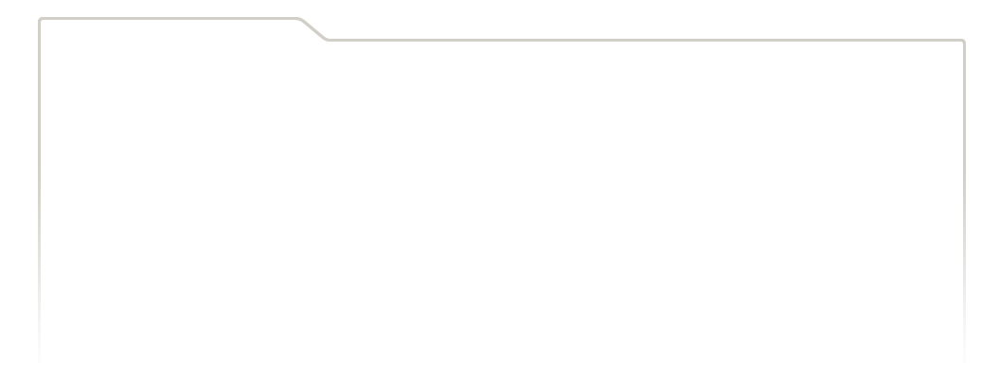
...
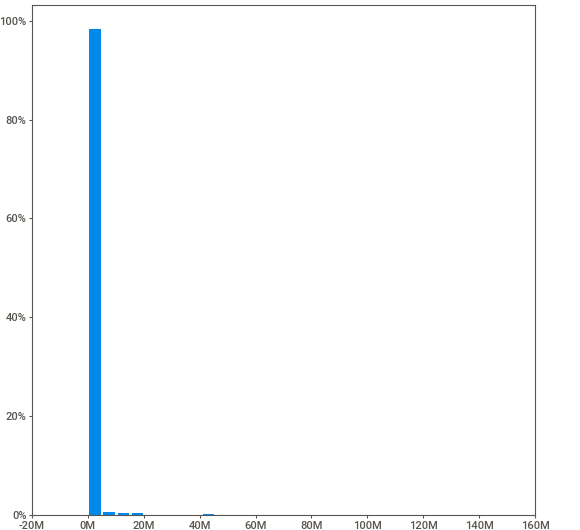
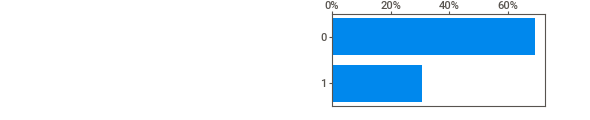
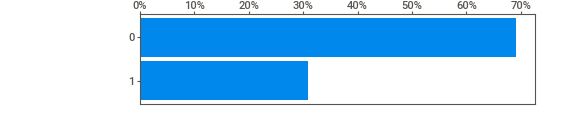
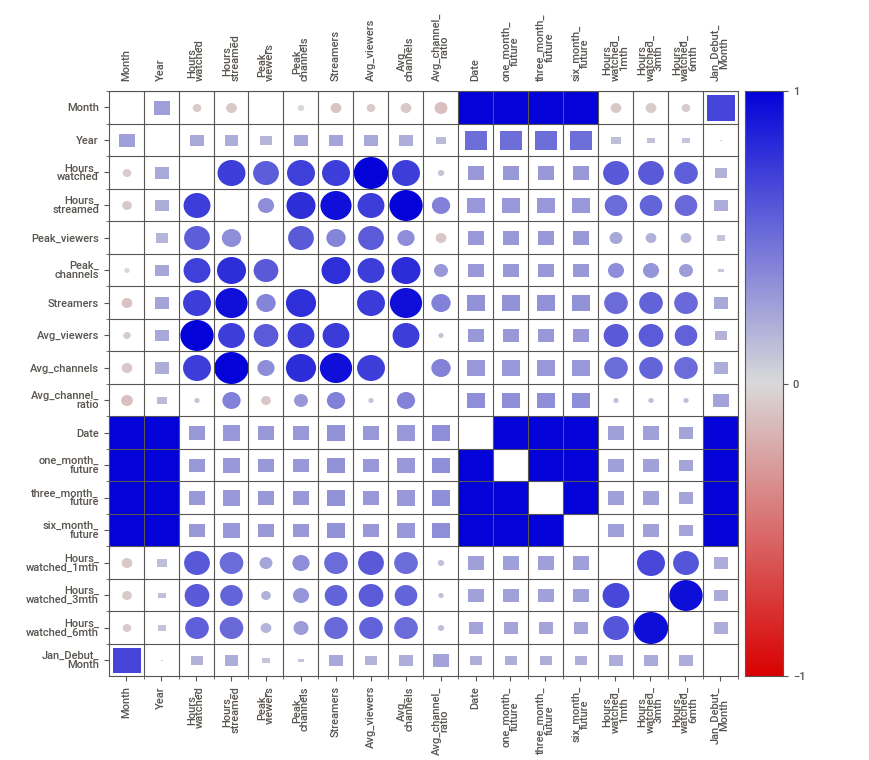
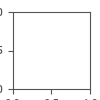

In [20]:
report = sv.analyze(no_2016_df)
report.show_notebook(  w=None, 
                h=None, 
                scale=None,
                layout='widescreen',
                filepath=None)

In [21]:
'''the correlation still holds, this may be a useful feature, and a surprising one at that'''

'the correlation still holds, this may be a useful feature, and a surprising one at that'

In [22]:
x = len(twitch_df_X)
top200_list = []
for i in range(x):
    if twitch_df_X['Hours_watched_1mth'][i] != 0:
        top200_list.append(1)
    else:
        top200_list.append(0)

In [23]:
twitch_df_X['Next_mth_200'] = top200_list

In [24]:
twitch_df_X.head()

,Game,Month,Year,Hours_watched,Hours_streamed,Peak_viewers,Peak_channels,Streamers,Avg_viewers,Avg_channels,Avg_channel_ratio,Date,one_month_future,three_month_future,six_month_future,Hours_watched_1mth,Hours_watched_3mth,Hours_watched_6mth,Jan_Debut_Month,Next_mth_200
0,7 Days to Die,1,2016,269681,12131,4405,44,1240,362.0,16.0,0.04,2016-01-01,2016-02-01,2016-04-01,2016-07-01,139365,212199,2063116,1,1
1,Agar.io,1,2016,255617,20705,4183,74,4472,344.0,28.0,0.08,2016-01-01,2016-02-01,2016-04-01,2016-07-01,254146,198757,0,1,1
2,Age of Empires,1,2016,248884,232,107455,18,40,335.0,0.0,0.00,2016-01-01,2016-02-01,2016-04-01,2016-07-01,0,0,0,1,0
3,Alien: Isolation,1,2016,264294,11799,9590,42,3968,355.0,16.0,0.05,2016-01-01,2016-02-01,2016-04-01,2016-07-01,109754,122248,0,1,1
4,American Truck Simulator,1,2016,314055,724,43089,48,186,422.0,1.0,0.00,2016-01-01,2016-02-01,2016-04-01,2016-07-01,2134600,141057,0,1,1


                                             |          | [  0%]   00:00 -> (? left)


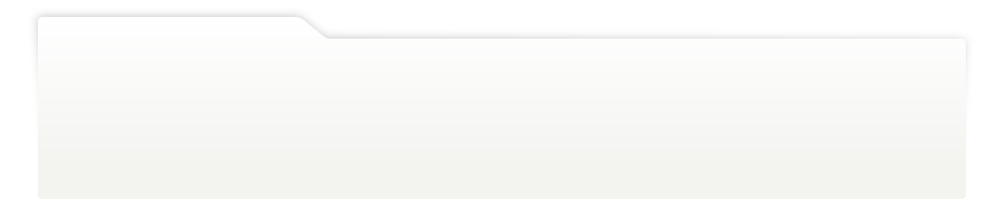
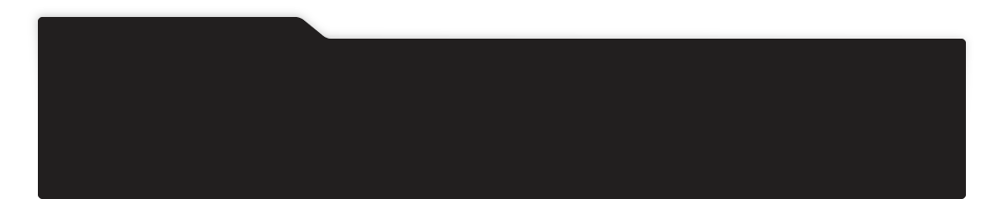
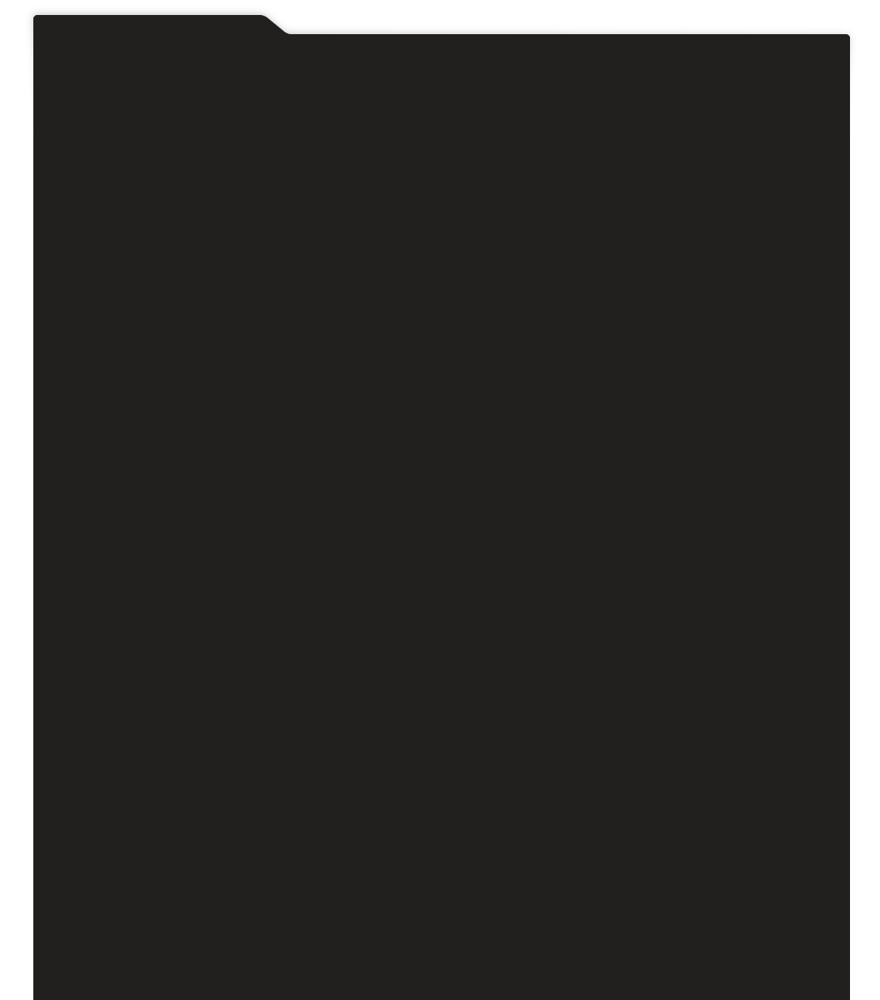
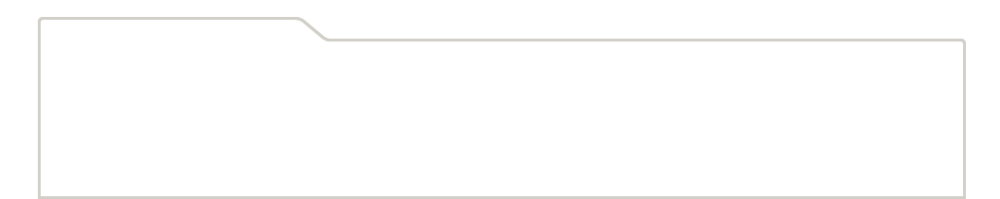
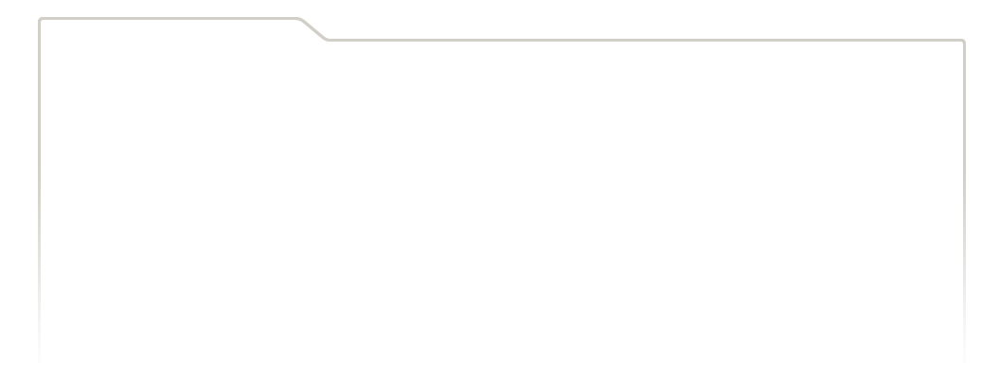
...
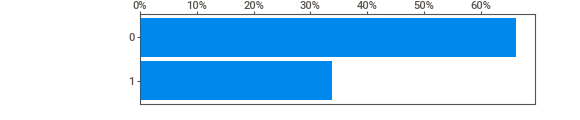
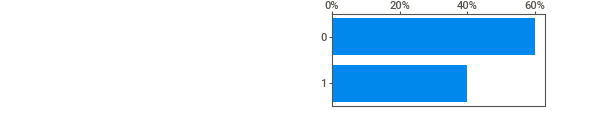
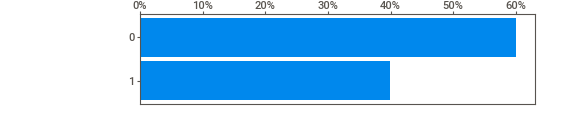
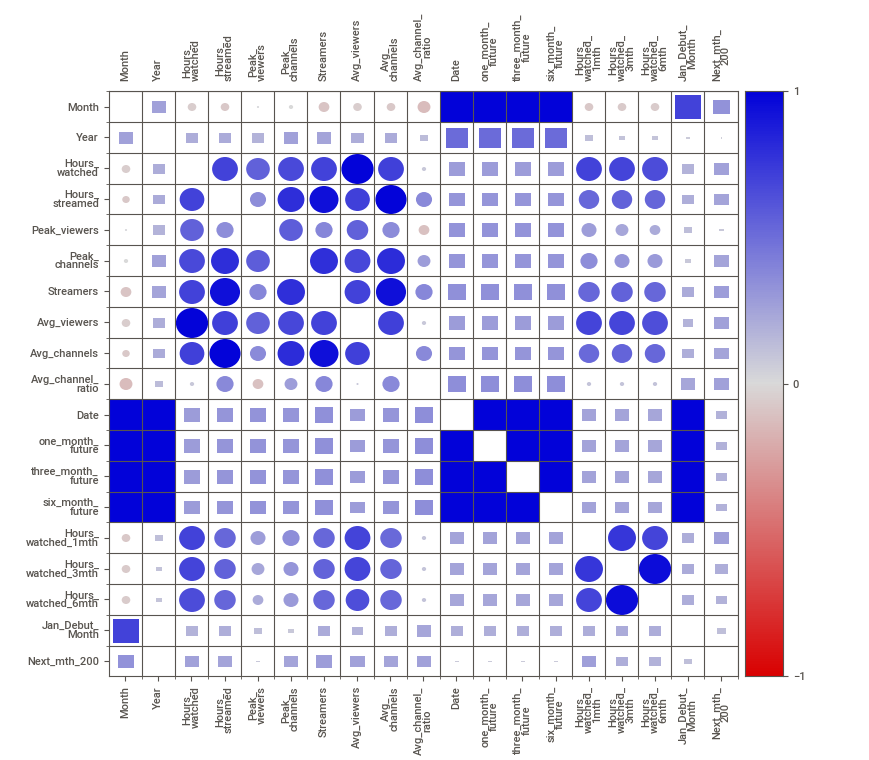
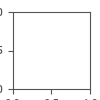

In [25]:
report = sv.analyze(twitch_df_X)
report.show_notebook(  w=None, 
                h=None, 
                scale=None,
                layout='widescreen',
                filepath=None)

In [27]:
twitch_df_X.to_pickle('twitch_df_wrng.pkl')